In this notebook, a comparison was done between different ways of scoring gene sets such as AUCell and UCell.

Environment: velocity

In [ ]:
import pandas
import scanpy
import hdf5plugin
import numpy
import gseapy
import single_cell_analysis
import pyucell
from pyscenic import aucell
import warnings

/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/ctxcore/__init__.py:5: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution


In [2]:
from importlib import reload

single_cell_analysis = reload(single_cell_analysis)

In [3]:
# Suppress warnings

warnings.simplefilter("ignore", category=UserWarning)

In [4]:
# Load data from Cellrank and SDEvelo

working_directory = "RNA Sequencing Data/"
base_name = "cellrank_version_5"
adata = scanpy.read_h5ad(
    working_directory+f"/diffusion_map_anndata.h5ad"
)
driver_df = pandas.read_csv(
    working_directory+f"{base_name}_driver_genes.csv",
    index_col=0
)
combined_driver_df = pandas.read_csv(
    working_directory+f"{base_name}_driver_genes_combined.csv",
    index_col=0
)
adata.obs["group"] = adata.obs["group"].cat.reorder_categories(["MEF", "mESC", "control", "Hic2"])

In [5]:
# Load adata with raw counts and filter

adata_raw = scanpy.read_h5ad(
    working_directory+f"/splice_counts.h5ad"
)

# If all genes should be used instead of just top 2000 variable

scanpy.pp.filter_genes(adata_raw, min_cells=20)
scanpy.pp.normalize_total(adata_raw, target_sum=1e6)
scanpy.pp.log1p(adata_raw)
adata_raw.obs = adata.obs
adata_raw.obsm = adata.obsm
adata_raw.uns["term_states_fwd_colors"] = adata.uns["term_states_fwd_colors"]
adata_raw.uns = adata.uns

print(adata_raw)

AnnData object with n_obs × n_vars = 12791 × 20917
    obs: 'barcode', 'batch', 'sample', 'group', 'day', 'seurat_clusters', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'latent_time', 'sde_velocity_self_transition', 'manual_root', 'manual_end', 'sde_velocity_pseudotime', 'leiden', 'macrostates_fwd', 'term_states_fwd', 'term_states_fwd_probs', 'init_states_fwd', 'init_states_fwd_probs', 'fate_probabilities_Dead end', 'fate_probabilities_Stem cell', 'macrostate', 'early_or_late', 'epithelial_score', 'keratinocyte_score', 'stem_cell_score', 'fibroblast_score', 'neuron_score', 'kupffer_score', 'apoptosis_score'
    var: 'ensemble_ids', 'gene_symbol', 'n_cells'
    uns: 'T_fwd_params', 'coarse_fwd', 'diffmap_evals', 'diffmap_neighbors', 'draw_graph', 'eigendecomposition_fwd', 'group_colors', 'init_states_fwd_colors', 'leiden', 'leiden_colors', 'leiden_rank_genes', 'log1p', 'macrostate_

In [6]:
# Read ChIP-seq targets
base_name = "ChIP Sequencing Data/chipseq_targets"

hic2_target_scores = pandas.read_csv(f"{base_name}_hic2_scores.csv", index_col=0)
klf4_hic2_target_scores = pandas.read_csv(f"{base_name}_klf4_hic2_scores.csv", index_col=0)
klf4_control_target_scores = pandas.read_csv(f"{base_name}_klf4_control_scores.csv", index_col=0)

hic2_targets = numpy.loadtxt(f"{base_name}_hic2_targets.txt", dtype=numpy.dtypes.StrDType)
klf4_hic2_targets = numpy.loadtxt(f"{base_name}_klf4_hic2_targets.txt", dtype=numpy.dtypes.StrDType)
klf4_control_targets = numpy.loadtxt(f"{base_name}_klf4_control_targets.txt", dtype=numpy.dtypes.StrDType)
klf4_targets = numpy.intersect1d(klf4_hic2_targets, klf4_control_targets)
shared_targets = numpy.intersect1d(hic2_targets, klf4_targets)

In [7]:
# Load bulk differential expression results

bulk_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_combined.csv", index_col=0)
bulk_metadata = pandas.read_csv("RNA Sequencing Data/bulk_sequencing_metadata.csv", index_col=0)
samples = bulk_metadata.index.to_list()
reprogramming_columns = bulk_de.columns[bulk_de.columns.str.contains("Reprogramming")]
reprogramming_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_reprogramming.csv", index_col=0)
mef_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_mef.csv", index_col=0)
mesc_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_mesc.csv", index_col=0)
ipsc_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_ipsc.csv", index_col=0)

In [8]:
# Variable genes and Cellrank drivers
variable_genes = adata.var_names.to_numpy()
variable_in_bulk = numpy.intersect1d(variable_genes, bulk_de.index.to_numpy())
stem_cell_drivers = driver_df.sort_values("Dead end_corr", ascending=True).head(100).index.to_numpy()
dead_end_drivers = driver_df.sort_values("Dead end_corr", ascending=False).head(100).index.to_numpy()

In [9]:
# Load list of transcription factors

tf_df = pandas.read_csv("ChIP Sequencing Data/Mus_musculus_TF.txt", sep="\t")
tf_array = tf_df["Symbol"].to_numpy()

differentially_expressed_genes = reprogramming_de.loc[variable_in_bulk].query("padj < 0.05").index.to_numpy()

# Find Hic2 target TFs that change significantly during reprogramming

# All target transcription factors
target_tfs = numpy.intersect1d(shared_targets, tf_array)

# Target transcription factors for which Hic2 changes expression significantly
de_target_tfs = numpy.intersect1d(target_tfs, differentially_expressed_genes)

# Differentially expressed targets that are drivers of dead end
de_dead_end_drivers = numpy.intersect1d(de_target_tfs, dead_end_drivers)

# Differentially expressed targets that are drivers of stem cells
de_stem_cell_drivers = numpy.intersect1d(de_target_tfs, stem_cell_drivers)

In [10]:
# Get gene sets
cell_markers = gseapy.get_library("PanglaoDB_Augmented_2021", organism="Mouse")
epithelial_markers = numpy.array(pandas.Series(cell_markers["Epithelial Cells"]).str.capitalize())
keratinocyte_markers = numpy.array(pandas.Series(cell_markers["Keratinocytes"]).str.capitalize())
stem_cell_markers = numpy.array(pandas.Series(cell_markers["Pluripotent Stem Cells"]).str.capitalize())
fibroblast_markers = numpy.array(pandas.Series(cell_markers["Fibroblasts"]).str.capitalize())
neuron_markers = numpy.array(pandas.Series(cell_markers["Neurons"]).str.capitalize())
kupffer_markers = numpy.array(pandas.Series(cell_markers["Kupffer Cells"]).str.capitalize())
msigdb = gseapy.get_library("MSigDB_Hallmark_2020", organism="Mouse")
p53_markers = numpy.array(pandas.Series(msigdb["p53 Pathway"]).str.capitalize())

2026-03-25 09:02:20 | [INFO] Downloading and generating Enrichr library gene sets...
2026-03-25 09:02:20 | [INFO] Library is already downloaded in: /home/avesta/m26_losu/.cache/gseapy/Enrichr.PanglaoDB_Augmented_2021.gmt, use local file
2026-03-25 09:02:20 | [INFO] Downloading and generating Enrichr library gene sets...
2026-03-25 09:02:20 | [INFO] Library is already downloaded in: /home/avesta/m26_losu/.cache/gseapy/Enrichr.MSigDB_Hallmark_2020.gmt, use local file


# Compare scoring methods with all genes

In [11]:
# PyUCell scores

signatures = {
    "fibroblast": fibroblast_markers,
    "keratinocyte": keratinocyte_markers,
    "epithelial": epithelial_markers,
    "stem_cell": stem_cell_markers,
    "p53": p53_markers
}

# Remove old scores
for name in signatures.keys():
    ucell_key = f"{name}_UCell"
    if ucell_key in adata_raw.obs_keys():
        del adata_raw.obs[ucell_key]

pyucell.compute_ucell_scores(adata_raw, signatures=signatures, chunk_size=10000, n_jobs=16)

network_scores_ucell = ["keratinocyte_UCell", "stem_cell_UCell", "p53_UCell"]

In [12]:
# Scanpy scores

for name, genes in signatures.items():
    scanpy.tl.score_genes(
        adata_raw,
        gene_list=numpy.intersect1d(genes, adata.var_names),
        score_name=f"{name}_score",
        use_raw=False
    )

network_scores = ["keratinocyte_score", "stem_cell_score", "p53_score"]

In [13]:
# AUCell scores

aucell_signatures = {}
for name, genes in signatures.items():
    valid_genes = [gene for gene in genes if gene in adata_raw.var_names]
    weight_dict = {gene: 1.0 for gene in valid_genes}
    aucell_signature = aucell.GeneSignature(name, weight_dict)
    aucell_signatures[name] = aucell_signature

expression_matrix = pandas.DataFrame(
    adata_raw.X.todense(), 
    index=adata_raw.obs.index, 
    columns=adata_raw.var_names
)
rank_matrix = aucell.create_rankings(expression_matrix)
result = aucell.aucell4r(rank_matrix, aucell_signatures.values())

# Add AUCell scores to adata_raw

for gene_set in result.columns:
    adata_raw.obs[f"{gene_set}_aucell"] = result[gene_set]

network_scores_aucell = ["keratinocyte_aucell", "stem_cell_aucell", "p53_aucell"]

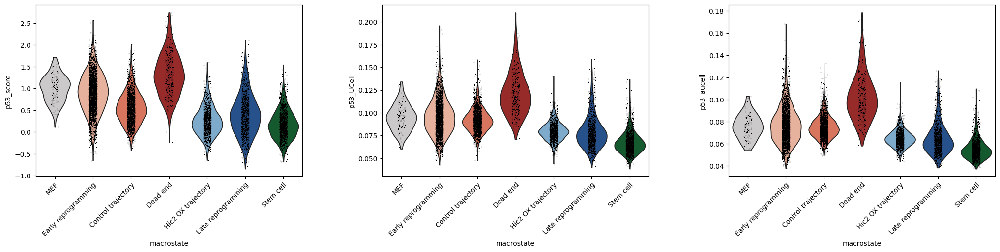

In [14]:
axes = scanpy.pl.violin(adata_raw, ["p53_score", "p53_UCell", "p53_aucell"], groupby="macrostate", show=False, use_raw=False)
for axis in axes:
    axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

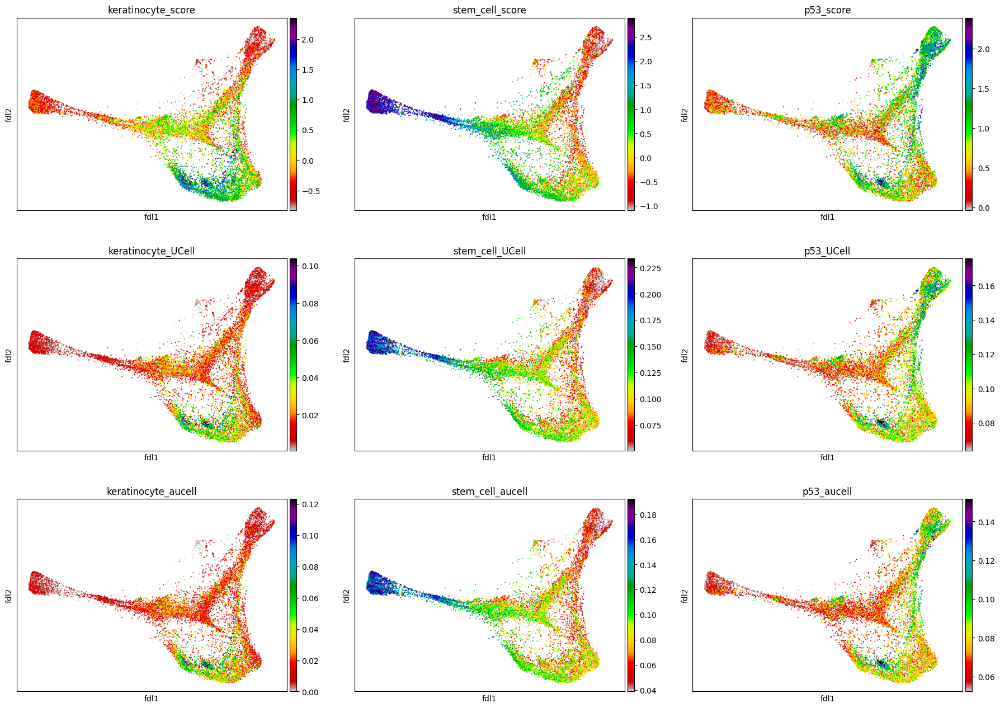

In [15]:
scanpy.pl.embedding(adata_raw, "fdl", color=network_scores+network_scores_ucell+network_scores_aucell, cmap="nipy_spectral_r", vmax="p99.9", vmin="p10", ncols=3)

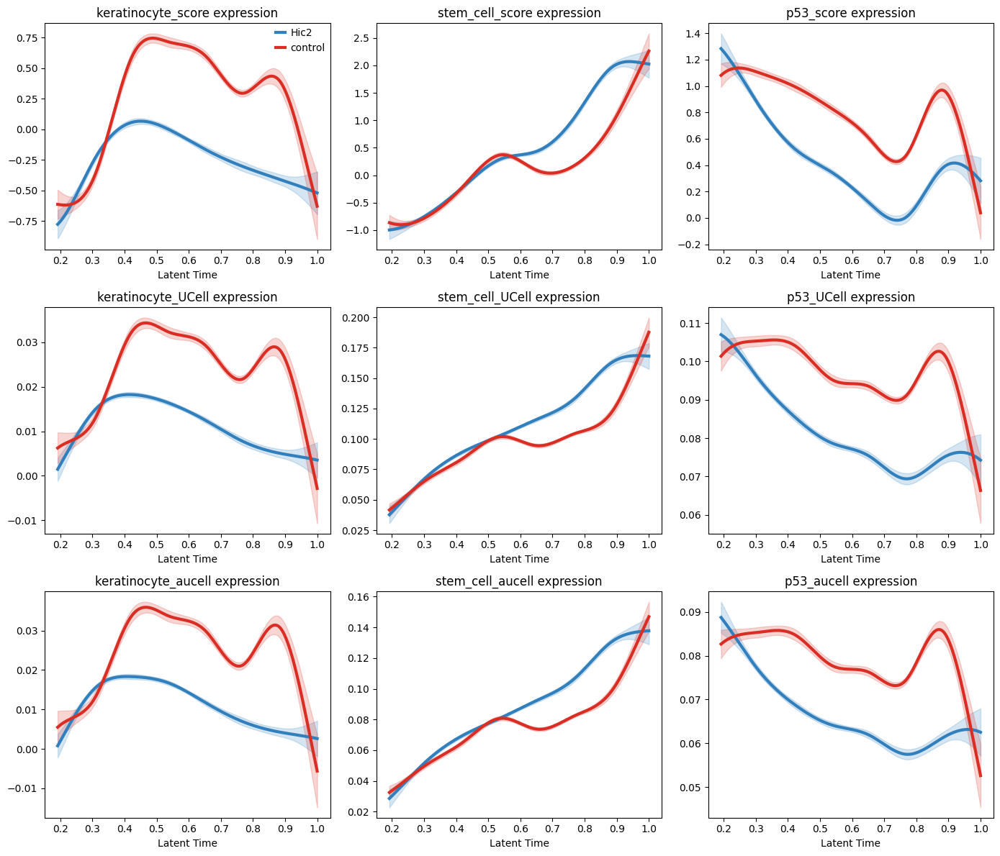

In [16]:
single_cell_analysis.plot_grouped_gene_trend(adata_raw, network_scores+network_scores_ucell+network_scores_aucell, groups=["Hic2", "control"], columns=3, n_splines=10)

2026-03-25 09:02:57 | [INFO] cffi mode is CFFI_MODE.ANY
2026-03-25 09:02:57 | [INFO] R home found: /home/avesta/m26_losu/miniconda3/envs/velocity/lib/R
2026-03-25 09:02:57 | [INFO] R library path: 
2026-03-25 09:02:57 | [INFO] LD_LIBRARY_PATH: 
2026-03-25 09:02:57 | [INFO] Default options to initialize R: rpy2, --quiet, --no-save
2026-03-25 09:02:57 | [INFO] Environment variable "PWD" redefined by R and overriding existing variable. Current: "/home/avesta/m26_losu", R: "/home/avesta/m26_losu/hic2_masters_project"
2026-03-25 09:02:58 | [INFO] R is already initialized. No need to initialize.


  0%|          | 0/9 [00:00<?, ?gene/s]

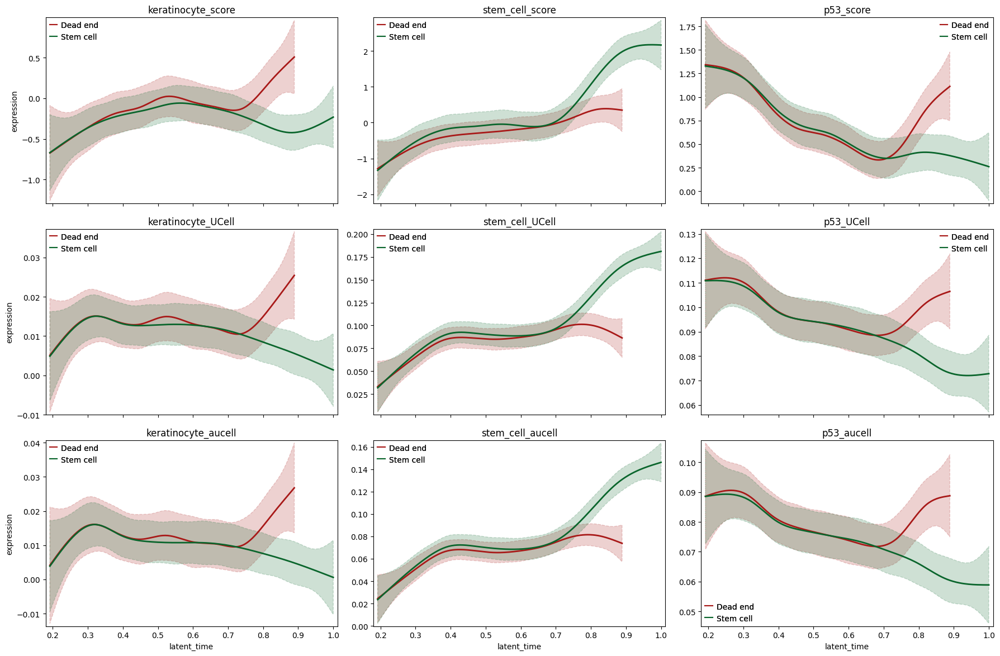

In [17]:
single_cell_analysis.plot_trends_by_trajectory(adata_raw, network_scores+network_scores_ucell+network_scores_aucell, groups=["control"], n_knots=10, n_columns=3)

  0%|          | 0/9 [00:00<?, ?gene/s]

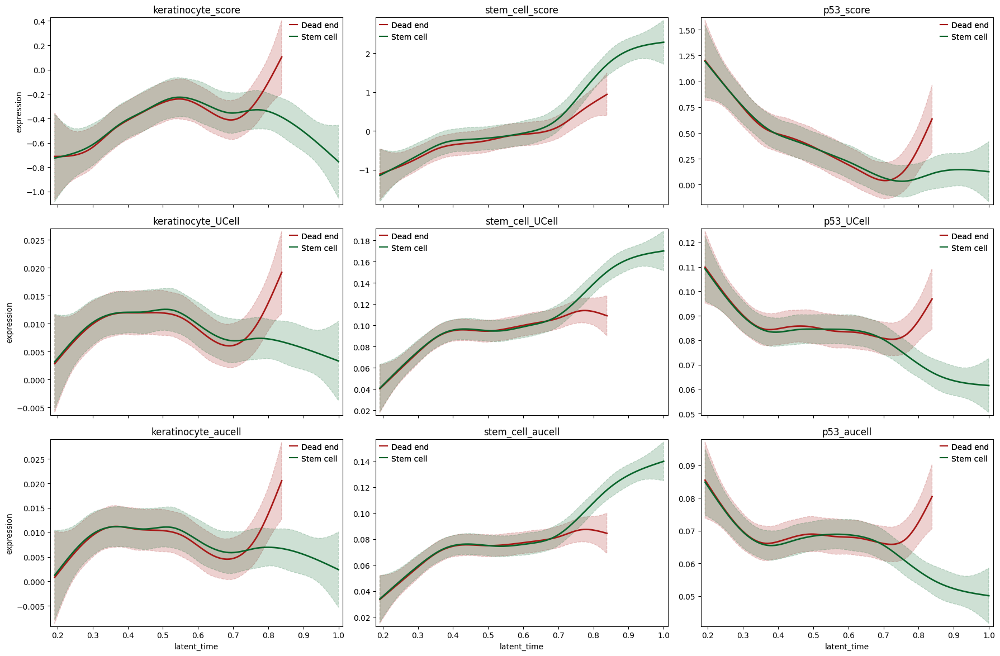

In [18]:
single_cell_analysis.plot_trends_by_trajectory(adata_raw, network_scores+network_scores_ucell+network_scores_aucell, groups=["Hic2"], n_knots=10, n_columns=3)

AUCell and PyUCell behave almost identically

## With top 2000 most variable

In [19]:
# PyUCell

signatures = {
    "fibroblast": fibroblast_markers,
    "keratinocyte": keratinocyte_markers,
    "epithelial": epithelial_markers,
    "stem_cell": stem_cell_markers,
    "p53": p53_markers
}

# Remove old scores
for name in signatures.keys():
    ucell_key = f"{name}_UCell"
    if ucell_key in adata.obs_keys():
        del adata.obs[ucell_key]

pyucell.compute_ucell_scores(adata, signatures=signatures, chunk_size=500, n_jobs=16)

In [20]:
# Scanpy scores

for name, genes in signatures.items():
    scanpy.tl.score_genes(
        adata,
        gene_list=numpy.intersect1d(genes, adata.var_names),
        score_name=f"{name}_score",
        use_raw=False
    )

network_scores = ["keratinocyte_score", "stem_cell_score", "p53_score"]
network_scores_ucell = ["keratinocyte_UCell", "stem_cell_UCell", "p53_UCell"]

In [21]:
# AUCell

aucell_signatures = {}
for name, genes in signatures.items():
    valid_genes = [gene for gene in genes if gene in adata.var_names]
    weight_dict = {gene: 1.0 for gene in valid_genes}
    aucell_signature = aucell.GeneSignature(name, weight_dict)
    aucell_signatures[name] = aucell_signature

expression_matrix = pandas.DataFrame(
    adata.X.todense(), 
    index=adata.obs.index, 
    columns=adata.var_names
)
rank_matrix = aucell.create_rankings(expression_matrix)

result = aucell.aucell4r(rank_matrix, aucell_signatures.values())

# Add AUCell scores to adata

for gene_set in result.columns:
    adata.obs[f"{gene_set}_aucell"] = result[gene_set]

network_scores_aucell = ["keratinocyte_aucell", "stem_cell_aucell", "p53_aucell"]

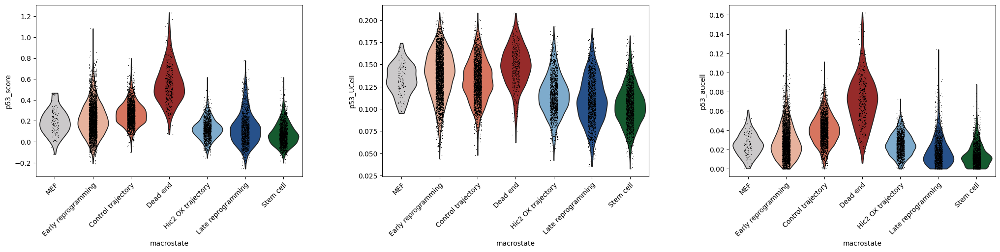

In [22]:
axes = scanpy.pl.violin(adata, ["p53_score", "p53_UCell", "p53_aucell"], groupby="macrostate", show=False, use_raw=False)
for axis in axes:
    axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

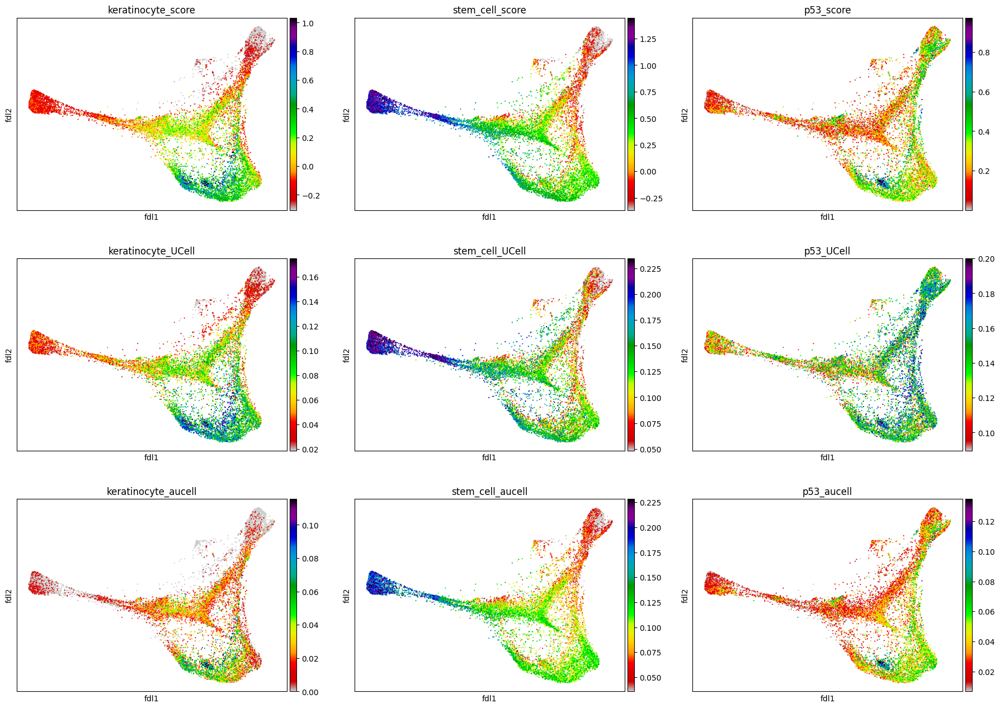

In [23]:
scanpy.pl.embedding(adata, "fdl", color=network_scores+network_scores_ucell+network_scores_aucell, cmap="nipy_spectral_r", vmax="p99.9", vmin="p10", ncols=3)

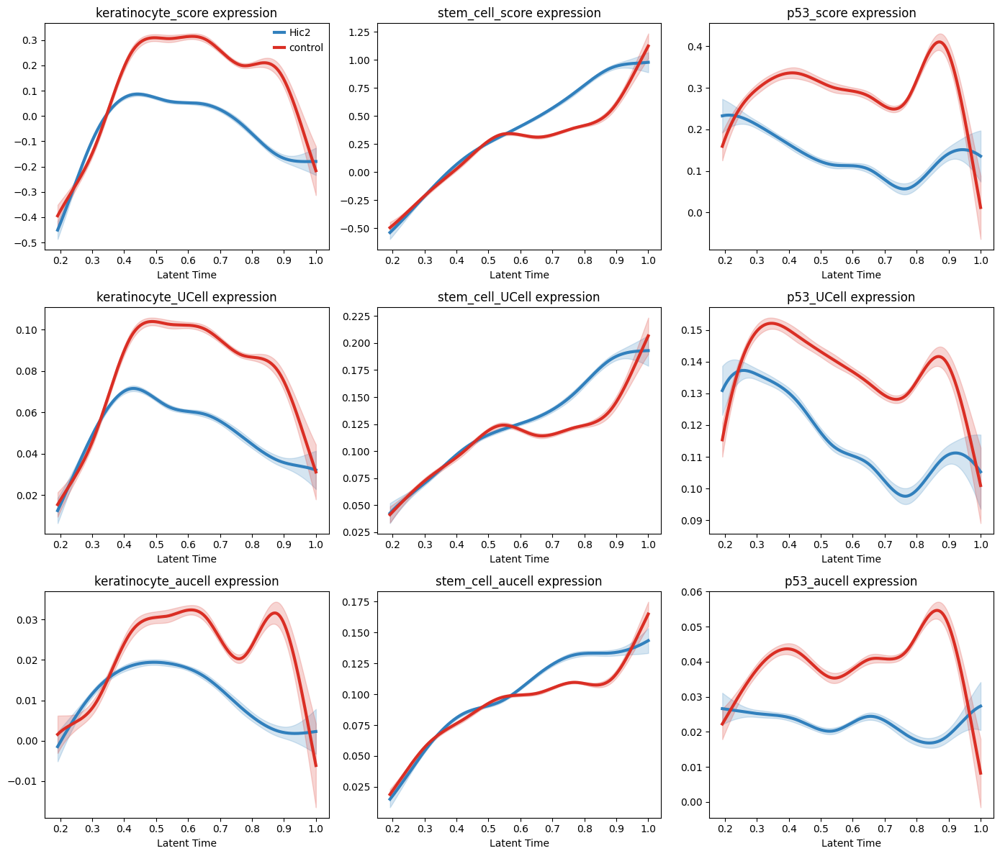

In [24]:
single_cell_analysis.plot_grouped_gene_trend(adata, network_scores+network_scores_ucell+network_scores_aucell, groups=["Hic2", "control"], columns=3, n_splines=10)

  0%|          | 0/9 [00:00<?, ?gene/s]

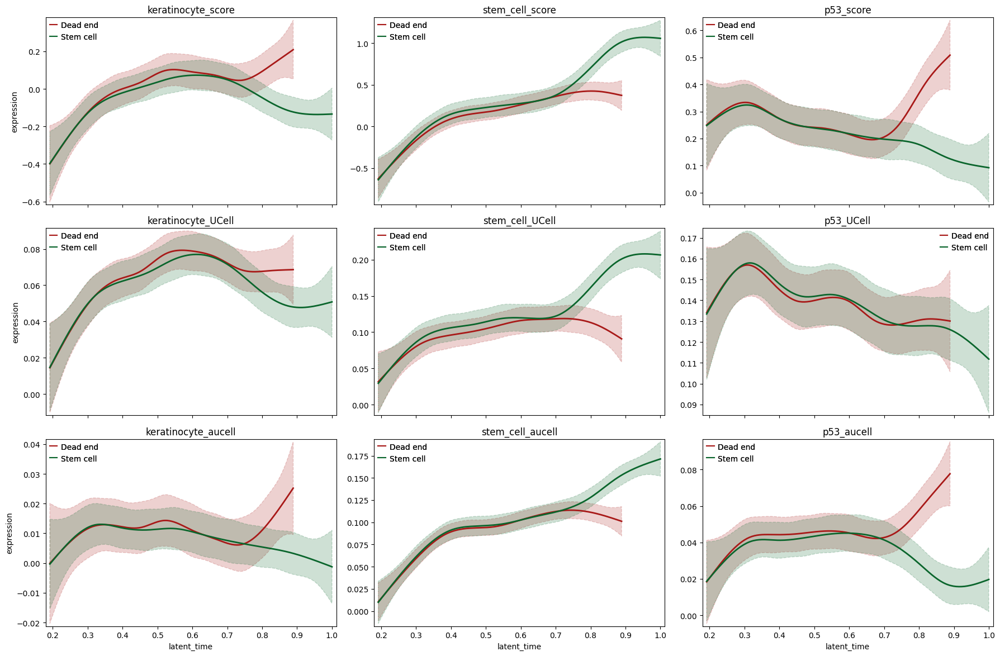

In [25]:
single_cell_analysis.plot_trends_by_trajectory(adata, network_scores+network_scores_ucell+network_scores_aucell, groups=["control"], n_knots=10, n_columns=3)

  0%|          | 0/9 [00:00<?, ?gene/s]

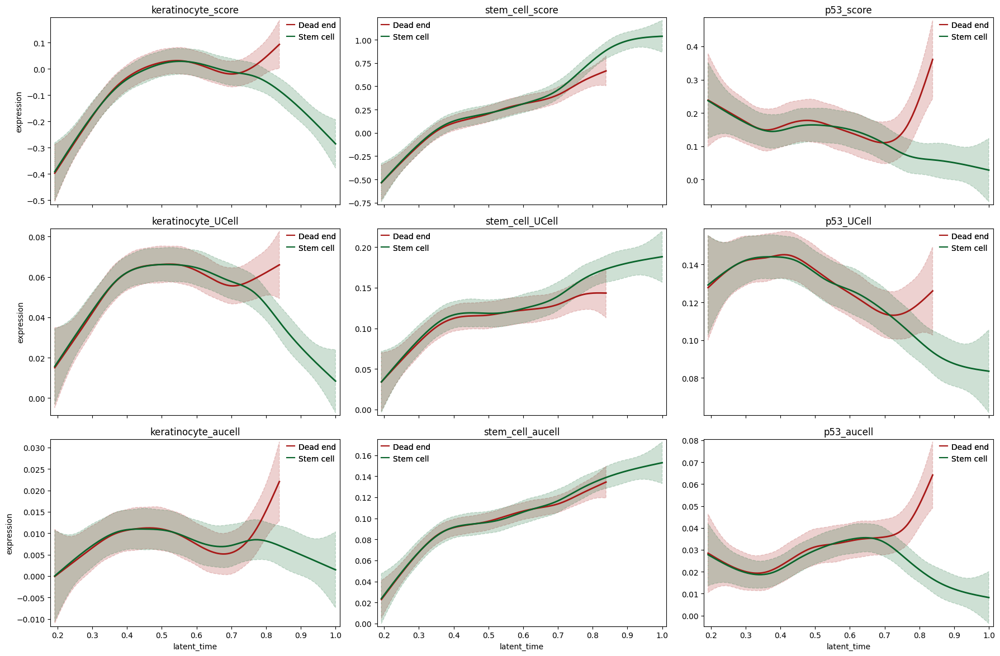

In [26]:
single_cell_analysis.plot_trends_by_trajectory(adata, network_scores+network_scores_ucell+network_scores_aucell, groups=["Hic2"], n_knots=10, n_columns=3)

UCell performs poorly with only the top 2000 variable genes, whereas AUCell still works.

# Use only p53 markers that are overexpressed in the dead end

In [27]:
# Get genes that are overexpressed in dead end

dead_end_de_df = pandas.read_csv("RNA Sequencing Data/macrostate_differential_expression_Dead end.csv", index_col=0)

In [28]:
manual_damage_markers = ["Atf3", "Mxd1", "Maff", "Zbtb10"]

In [29]:
aucell_signatures = []
top_de_list = [50, 100, 200, 500, 1000, 2000]
for top_de in top_de_list:
    genes = numpy.intersect1d(p53_markers, dead_end_de_df.head(top_de).index)
    valid_genes = [gene for gene in genes if gene in adata.var_names]
    weight_dict = {gene: 1.0 for gene in valid_genes}
    aucell_signature = aucell.GeneSignature(f"p53_top_{top_de}", weight_dict)
    aucell_signatures.append(aucell_signature)

expression_matrix = pandas.DataFrame(
    adata_raw.X.todense(), 
    index=adata_raw.obs.index, 
    columns=adata_raw.var_names
)
rank_matrix = aucell.create_rankings(expression_matrix)

# Run AUCell
result = aucell.aucell4r(rank_matrix, aucell_signatures)

# Add AUCell scores to adata
for gene_set in result.columns:
    adata_raw.obs[f"{gene_set}_aucell"] = result[gene_set]

score_columns_aucell = [f"p53_top_{top_de}_aucell" for top_de in top_de_list]

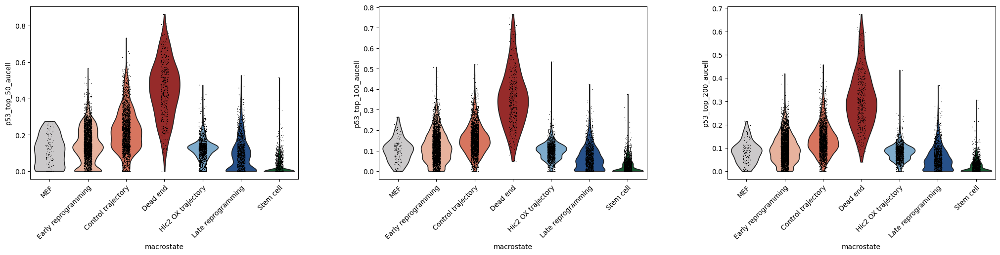

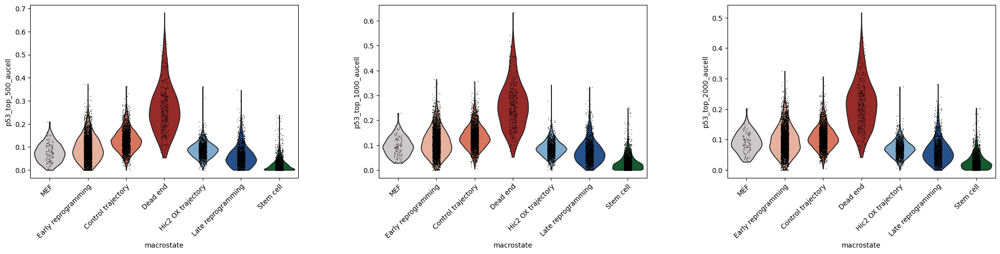

In [30]:
axes = scanpy.pl.violin(adata_raw, score_columns_aucell[:3], groupby="macrostate", show=False, use_raw=False)
for axis in axes:
    axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

axes = scanpy.pl.violin(adata_raw, score_columns_aucell[3:], groupby="macrostate", show=False, use_raw=False)
for axis in axes:
    axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

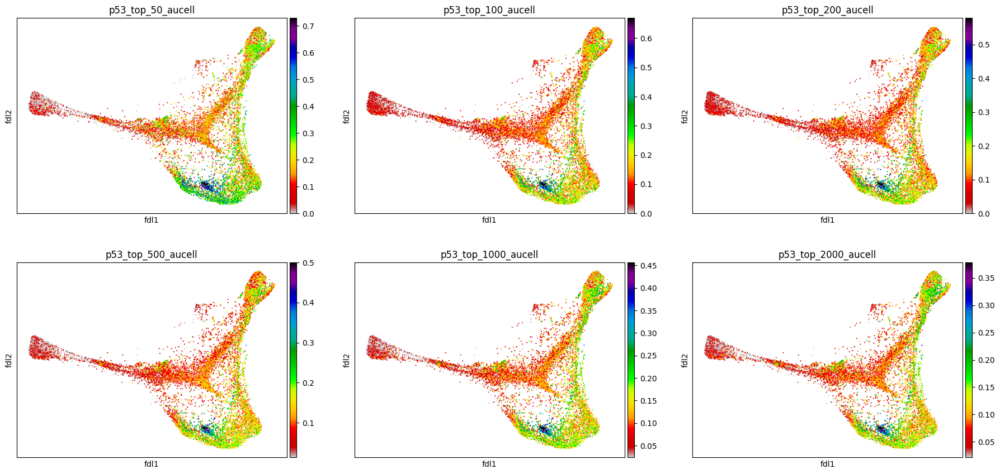

In [31]:
scanpy.pl.embedding(adata_raw, "fdl", color=score_columns_aucell, cmap="nipy_spectral_r", vmax="p99.9", vmin="p10", ncols=3)

Any number between 200 and 1000 appears to be able to separate dead end from other states well.

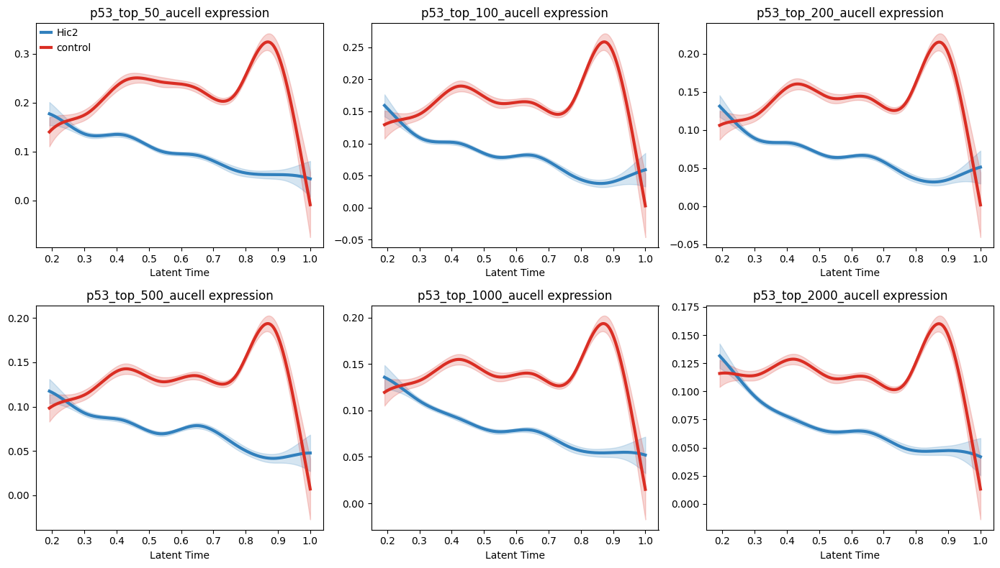

In [32]:
single_cell_analysis.plot_grouped_gene_trend(adata_raw, score_columns_aucell, groups=["Hic2", "control"], columns=3, n_splines=10)

  0%|          | 0/6 [00:00<?, ?gene/s]

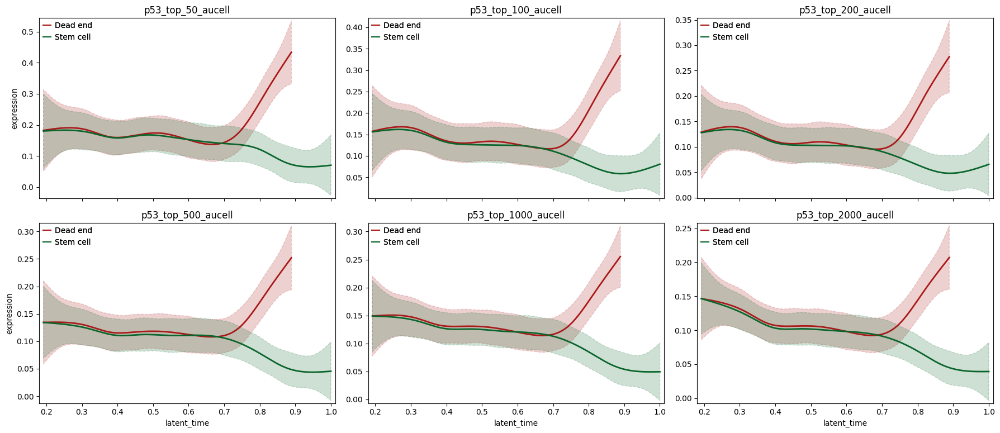

In [33]:
single_cell_analysis.plot_trends_by_trajectory(adata_raw, score_columns_aucell, groups=["control"], n_knots=10, n_columns=3)

  0%|          | 0/6 [00:00<?, ?gene/s]

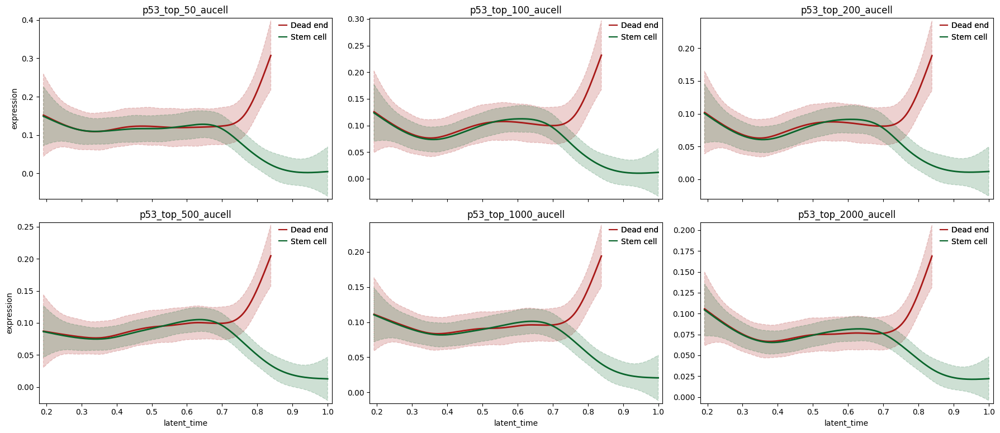

In [34]:
single_cell_analysis.plot_trends_by_trajectory(adata_raw, score_columns_aucell, groups=["Hic2"], n_knots=10, n_columns=3)

In [35]:
# Show which genes are used

print(numpy.intersect1d(p53_markers, dead_end_de_df.head(100).index))
print()
print(numpy.intersect1d(p53_markers, dead_end_de_df.head(1000).index))
print()
print(numpy.intersect1d(p53_markers, dead_end_de_df.head(2000).index))

['Atf3' 'Btg1' 'Btg2' 'Cdkn1a' 'Ctsd' 'Jun' 'Krt17' 'Ndrg1' 'Nupr1' 'Perp'
 'Ppp1r15a' 'Rack1' 'Rpl18' 'Rpl36' 'Rps12' 'Sat1' 'Sfn' 'St14' 'Tob1']

['Atf3' 'Baiap2' 'Btg1' 'Btg2' 'Cd81' 'Cdkn1a' 'Ctsd' 'Ddit3' 'Ddit4'
 'Dnttip2' 'Ei24' 'Epha2' 'Ephx1' 'Eps8l2' 'Foxo3' 'Gm2a' 'Gpx2' 'Ifi30'
 'Inhbb' 'Itgb4' 'Jun' 'Krt17' 'Mapkapk3' 'Mdm2' 'Mknk2' 'Mxd1' 'Ndrg1'
 'Nol8' 'Notch1' 'Nupr1' 'Pdgfa' 'Perp' 'Phlda3' 'Plk2' 'Plxnb2' 'Pmm1'
 'Ppp1r15a' 'Ptpn14' 'Rack1' 'Rpl18' 'Rpl36' 'Rps12' 'Sat1' 'Sfn' 'Slc3a2'
 'St14' 'Tob1' 'Trib3' 'Vamp8']

['Acvr1b' 'Ada' 'App' 'Atf3' 'Baiap2' 'Btg1' 'Btg2' 'Cd81' 'Cdkn1a' 'Ctsd'
 'Ddit3' 'Ddit4' 'Def6' 'Dgka' 'Dnttip2' 'Ei24' 'Epha2' 'Ephx1' 'Eps8l2'
 'Ercc5' 'Foxo3' 'Gadd45a' 'Gm2a' 'Gpx2' 'Hmox1' 'Ifi30' 'Inhbb' 'Irak1'
 'Itgb4' 'Jag2' 'Jun' 'Klf4' 'Krt17' 'Mapkapk3' 'Mdm2' 'Mknk2' 'Mxd1'
 'Ndrg1' 'Ninj1' 'Nol8' 'Notch1' 'Nupr1' 'Pdgfa' 'Perp' 'Phlda3' 'Pitpnc1'
 'Plk2' 'Plk3' 'Plxnb2' 'Pmm1' 'Pom121' 'Ppm1d' 'Ppp1r15a' 'Prkab1'
 'Ptpn14' 'Rack1' 'Rpl1

# Compare AUCell with UCell on this data

In [36]:
# PyUCell scores

signatures = {}
top_de_list = [50, 100, 200, 500, 1000, 2000]
for top_de in top_de_list:
    genes = numpy.intersect1d(p53_markers, dead_end_de_df.head(top_de).index)
    name = f"p53_top_{top_de}"
    signatures[name] = genes

# Remove old scores
for name in signatures.keys():
    ucell_key = f"{name}_ucell"
    if ucell_key in adata_raw.obs_keys():
        del adata_raw.obs[ucell_key]

pyucell.compute_ucell_scores(adata_raw, signatures=signatures, chunk_size=10000, n_jobs=16, suffix="_ucell")

score_columns_ucell = [f"p53_top_{top_de}_ucell" for top_de in top_de_list]

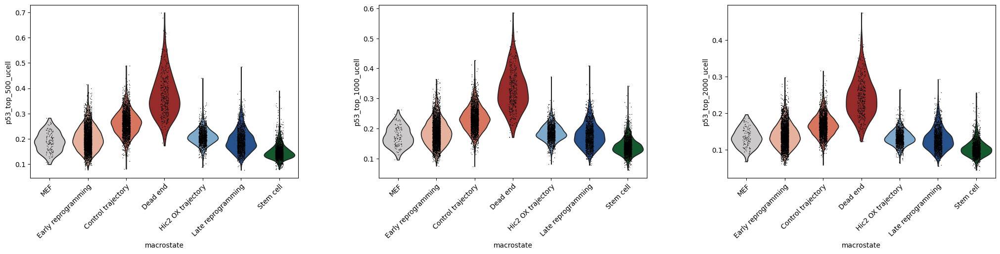

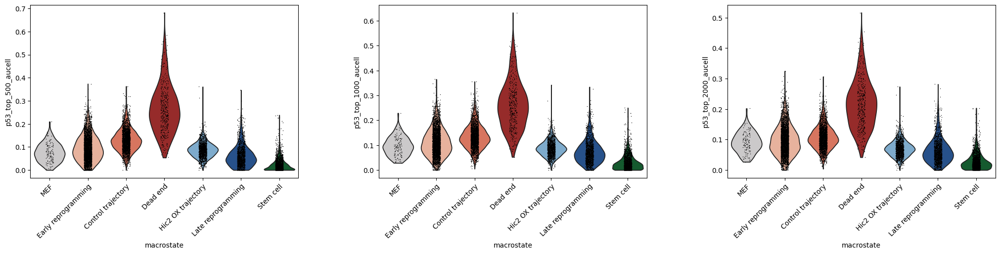

In [37]:
axes = scanpy.pl.violin(adata_raw, score_columns_ucell[3:], groupby="macrostate", show=False, use_raw=False)
for axis in axes:
    axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

axes = scanpy.pl.violin(adata_raw, score_columns_aucell[3:], groupby="macrostate", show=False, use_raw=False)
for axis in axes:
    axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

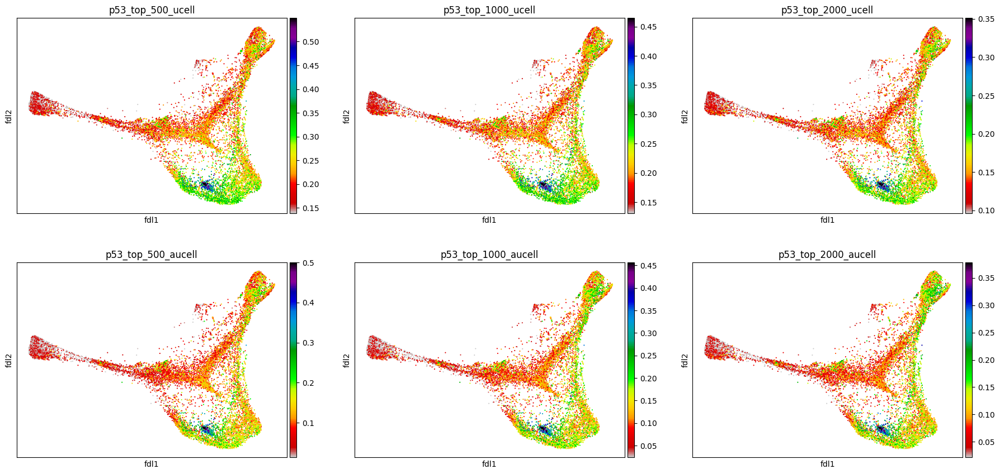

In [38]:
scanpy.pl.embedding(adata_raw, "fdl", color=score_columns_ucell[3:] + score_columns_aucell[3:], cmap="nipy_spectral_r", vmax="p99.9", vmin="p10", ncols=3)

UCell gives slightly higher expression in the control and Hic2 OX pathway, but also in the dead end.

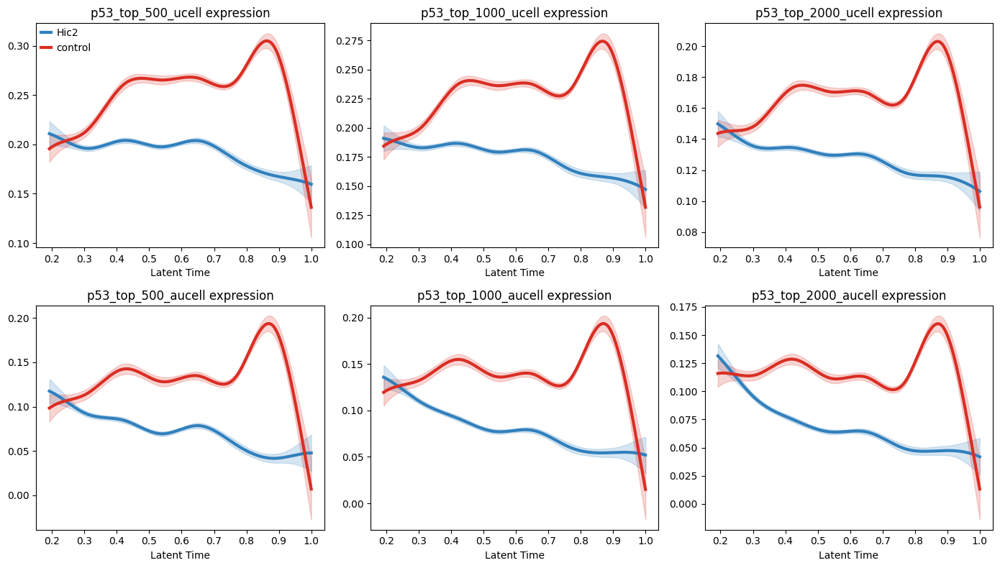

In [39]:
single_cell_analysis.plot_grouped_gene_trend(adata_raw, score_columns_ucell[3:] + score_columns_aucell[3:], groups=["Hic2", "control"], columns=3, n_splines=10)

UCell shows a larger separation between the two trajectories, but possibly weaker separation of the dead end.

  0%|          | 0/6 [00:00<?, ?gene/s]

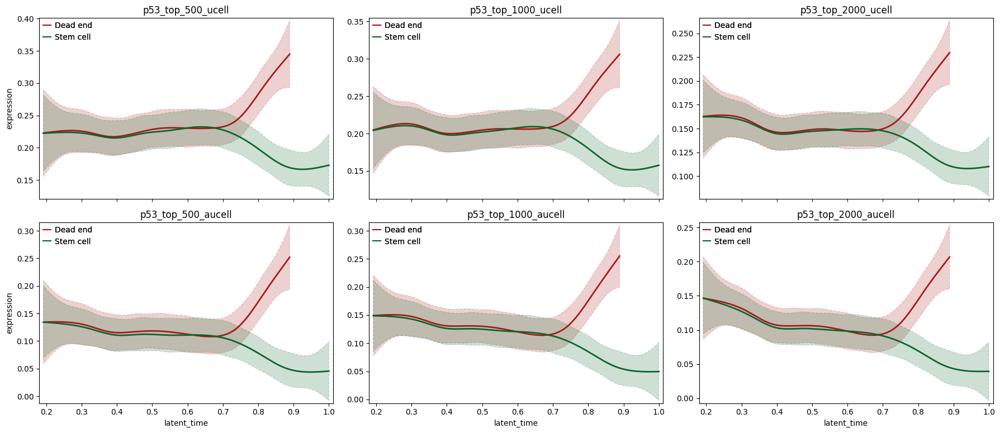

In [40]:
single_cell_analysis.plot_trends_by_trajectory(adata_raw, score_columns_ucell[3:] + score_columns_aucell[3:], groups=["control"], n_knots=10, n_columns=3)

  0%|          | 0/6 [00:00<?, ?gene/s]

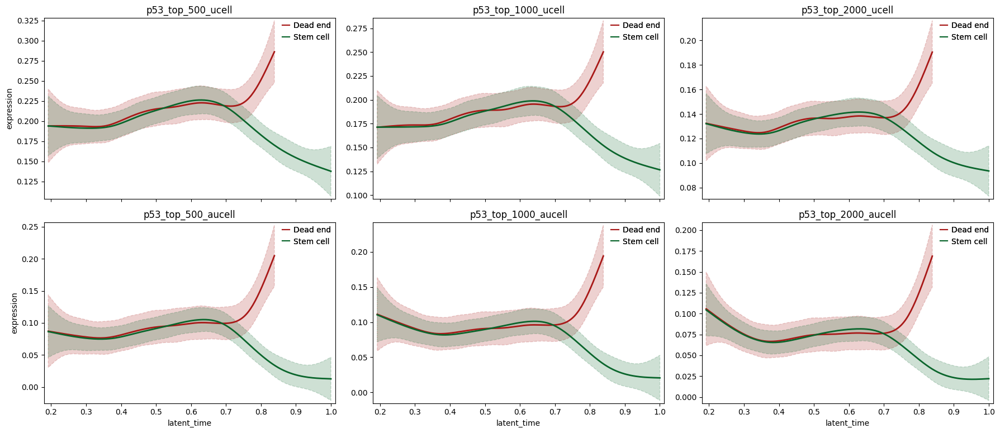

In [41]:
single_cell_analysis.plot_trends_by_trajectory(adata_raw, score_columns_ucell[3:] + score_columns_aucell[3:], groups=["Hic2"], n_knots=10, n_columns=3)

UCell can still separate the control and Hic2 OX pathway. It does not seem to perform worse.

# Compare AUCell scores with specific genes

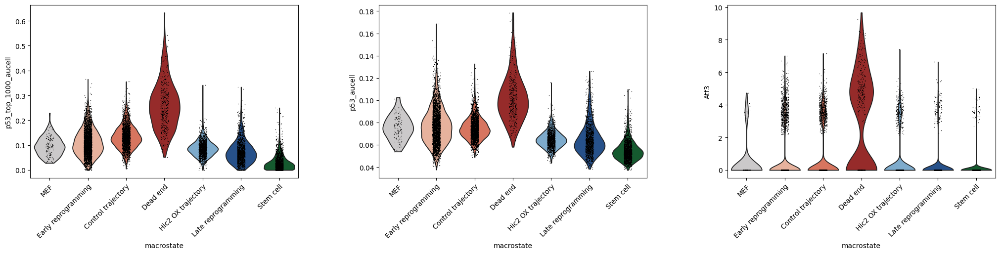

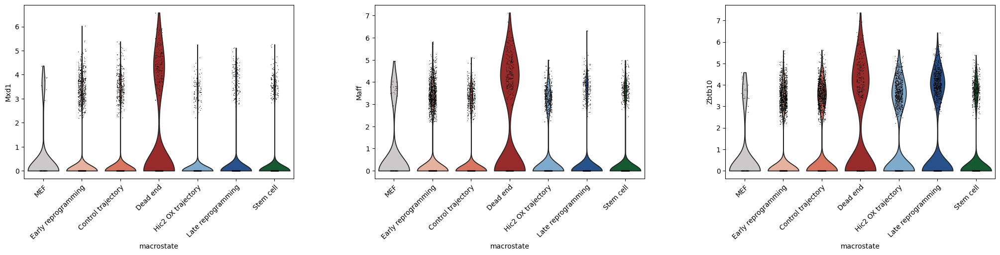

In [42]:
damage_scores = ["p53_top_1000_aucell", "p53_aucell"] + manual_damage_markers

for i in range(0, len(damage_scores)-2, 3):
    axes = scanpy.pl.violin(adata_raw, damage_scores[i:i+3], groupby="macrostate", show=False, use_raw=False)
    for axis in axes:
        axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

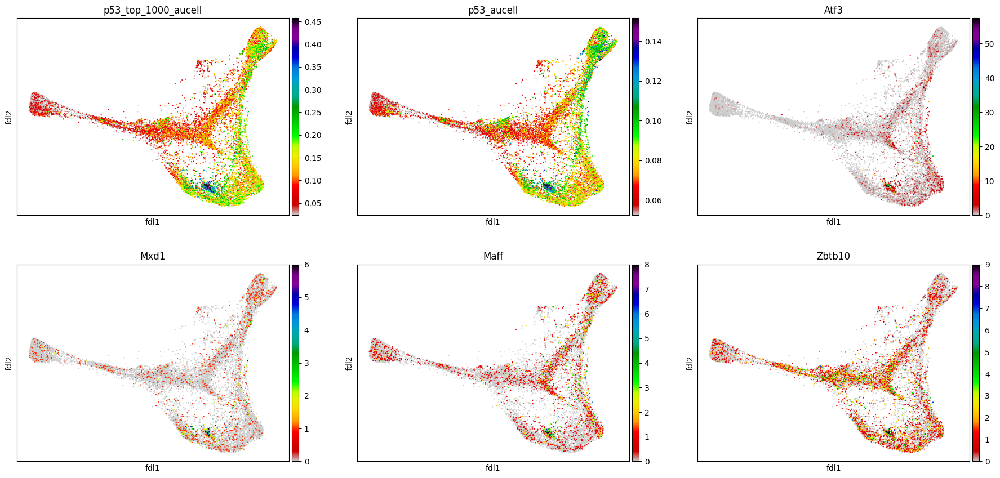

In [43]:
scanpy.pl.embedding(adata_raw, "fdl", color=damage_scores, cmap="nipy_spectral_r", vmax="p99.9", vmin="p10", ncols=3)

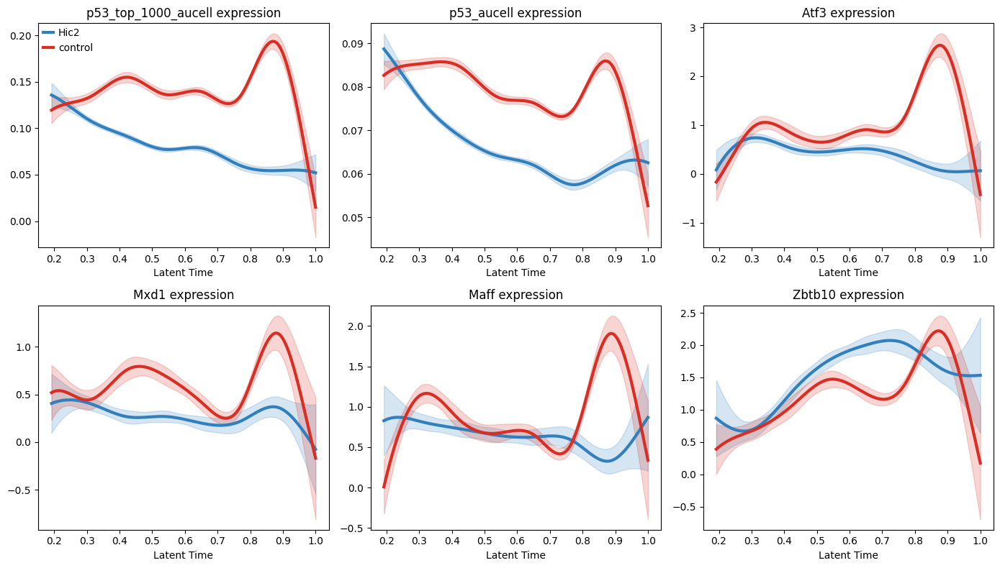

In [44]:
single_cell_analysis.plot_grouped_gene_trend(adata_raw, damage_scores, groups=["Hic2", "control"], columns=3, n_splines=10)

  0%|          | 0/6 [00:00<?, ?gene/s]

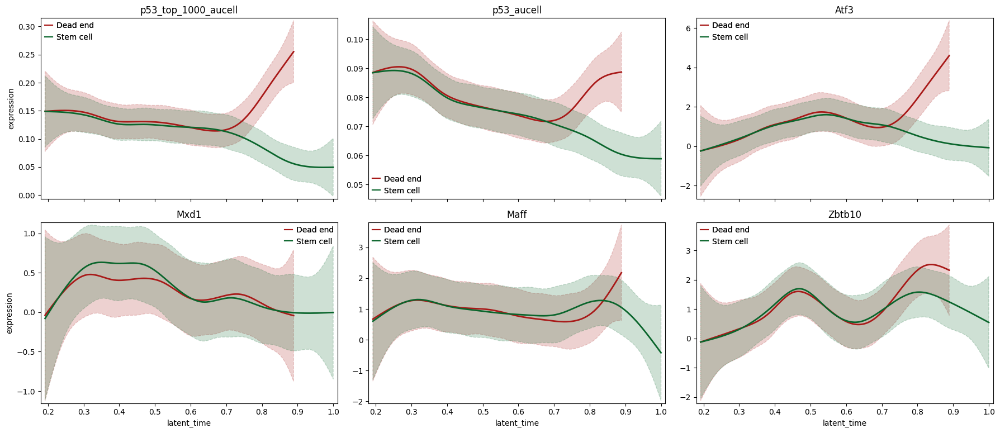

In [45]:
single_cell_analysis.plot_trends_by_trajectory(adata_raw, damage_scores, groups=["control"], n_knots=10, n_columns=3)

  0%|          | 0/6 [00:00<?, ?gene/s]

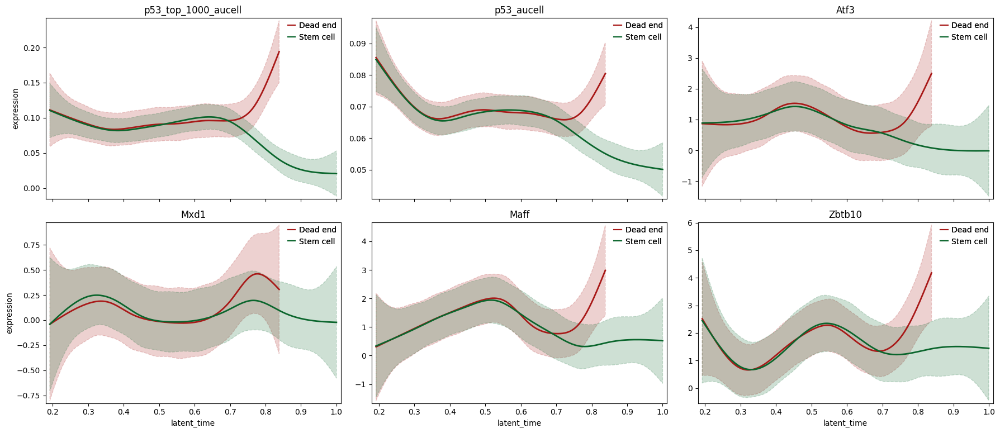

In [46]:
single_cell_analysis.plot_trends_by_trajectory(adata_raw, damage_scores, groups=["Hic2"], n_knots=10, n_columns=3)

The p53 top 1000 score is less noisy than Atf3 since it does not have dropouts. The main difference is that p53 top 1000 decreases over time in Hic2 OX, whereas Atf3 is 0 basically everywhere except in the dead end.

# Compare the best scores

In [57]:
scanpy.tl.score_genes(
        adata_raw,
        gene_list=numpy.intersect1d(p53_markers, dead_end_de_df.head(1000).index),
        score_name=f"p53_top_1000_scanpy",
        use_raw=False
)
adata_raw.obs["p53_scanpy"] = adata_raw.obs["p53_score"]

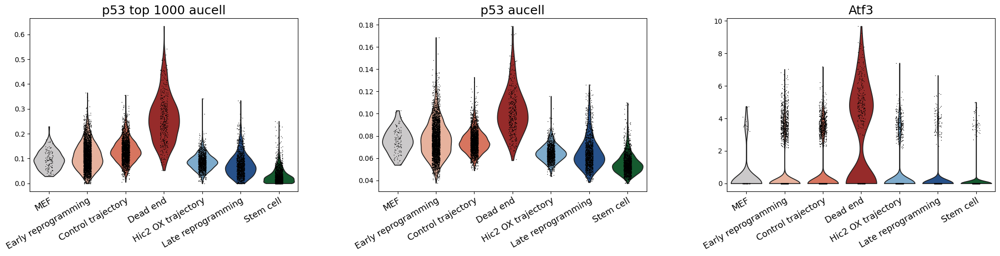

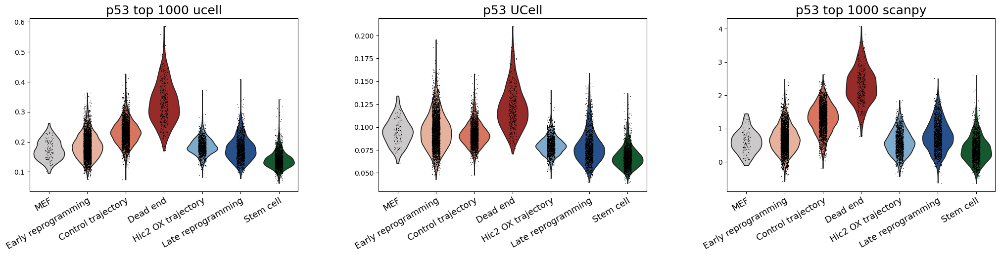

In [71]:
best_scores = ["p53_top_1000_aucell", "p53_aucell", "Atf3", "p53_top_1000_ucell", "p53_UCell", "p53_top_1000_scanpy"]

axes = scanpy.pl.violin(adata_raw, best_scores[:3], groupby="macrostate", show=False, use_raw=False)
for axis in axes:
    axis.set_xticklabels(axis.get_xticklabels(), rotation=30, ha="right", rotation_mode="anchor", fontsize=13)
    axis.set_xlabel("")
    axis.set_title(str.join(" ", axis.get_ylabel().split("_")), fontsize=18)
    axis.set_ylabel("")

axes = scanpy.pl.violin(adata_raw, best_scores[3:], groupby="macrostate", show=False, use_raw=False)
for axis in axes:
    axis.set_xticklabels(axis.get_xticklabels(), rotation=30, ha="right", rotation_mode="anchor", fontsize=13)
    axis.set_xlabel("")
    axis.set_title(str.join(" ", axis.get_ylabel().split("_")), fontsize=18)
    axis.set_ylabel("")

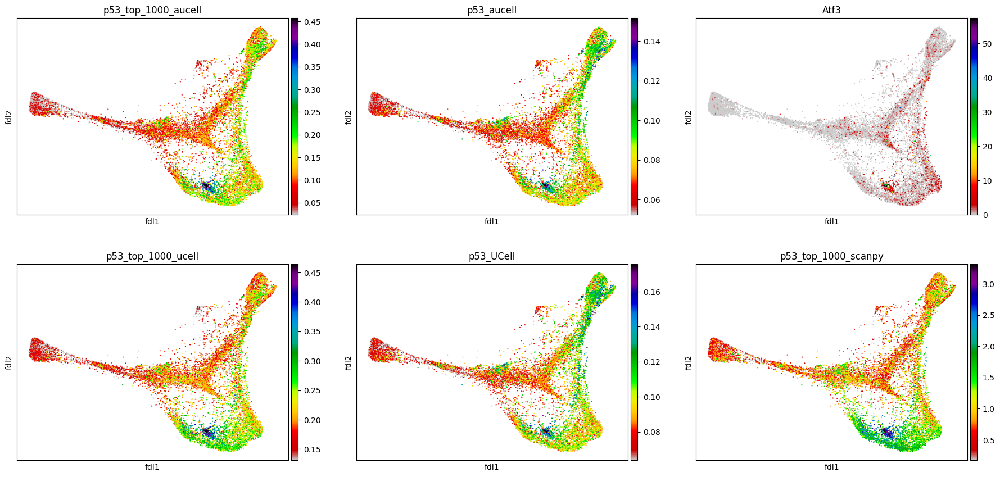

In [59]:
scanpy.pl.embedding(adata_raw, "fdl", color=best_scores, cmap="nipy_spectral_r", vmax="p99.9", vmin="p10", ncols=3)

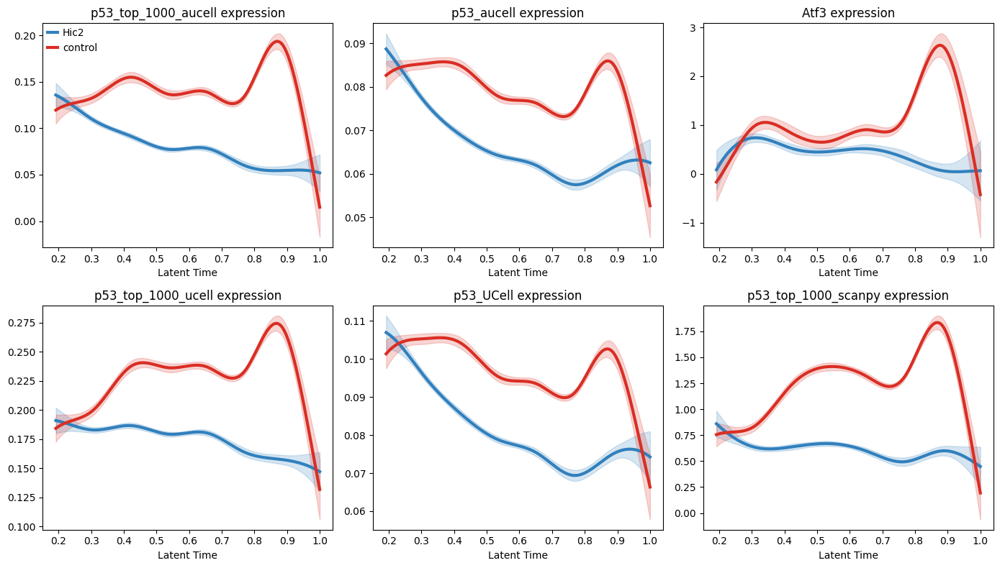

In [60]:
single_cell_analysis.plot_grouped_gene_trend(adata_raw, best_scores, groups=["Hic2", "control"], columns=3, n_splines=10)

  0%|          | 0/6 [00:00<?, ?gene/s]

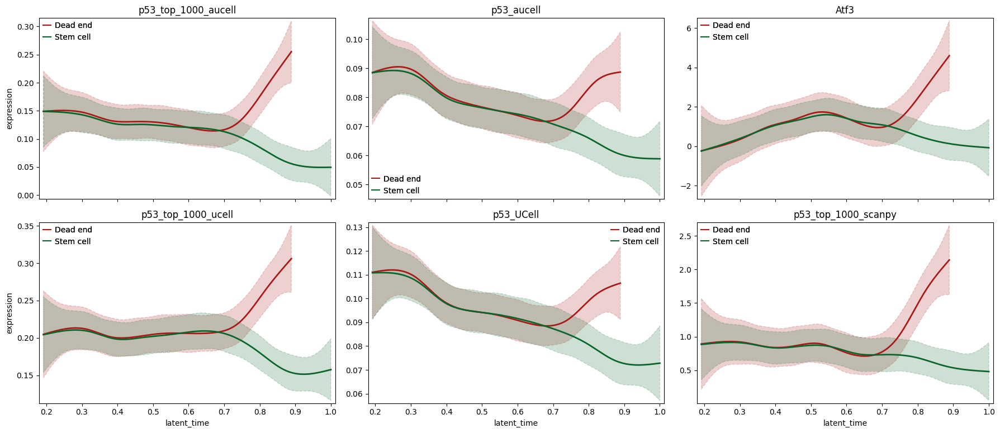

In [61]:
single_cell_analysis.plot_trends_by_trajectory(adata_raw, best_scores, groups=["control"], n_knots=10, n_columns=3)

  0%|          | 0/6 [00:00<?, ?gene/s]

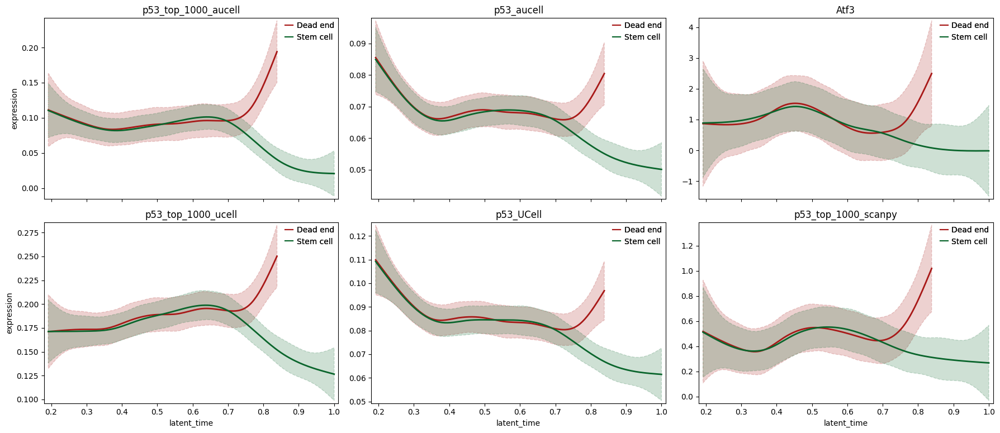

In [62]:
single_cell_analysis.plot_trends_by_trajectory(adata_raw, best_scores, groups=["Hic2"], n_knots=10, n_columns=3)

# Conclusion

The best method appears to be using p53 genes that are among the most differentially expressed in the dead end. Between 50 and 2000 top genes, the choice of number of top differentially expressed genes does not affect the results significantly. Top 1000 could be chosen.